# Stevens Dataset

**About:**

- The legal system of the United States operates at the state level and at the federal level
- Federal courts hear cases beyond the scope of state law
- Federal courts are divided into:
    - District Courts: Makes initial decision
    - Circuit Courts: Hears appeals from the district courts
    - Supreme Court: Highest level – makes final decision
- The Supreme Court Consists of nine judges (“justices”), appointed by the President
- Justices are distinguished judges,professors of law, state and federal attorneys
- The Supreme Court of the United States (SCOTUS) decides on most difficult and controversial cases
- Often involve interpretation of Constitution, Significant social, political and economic consequences

**Supreme Court Case Prediction:**
- Legal academics and political scientists regularly make predictions of SCOTUS decisions from detailed studies of cases and individual justices
- In 2002, Andrew Martin, a professor of political science at Washington University in St. Louis, decided to instead predict decisions using a statistical
model built from data
• Together with his colleagues, he decided to test this
model against a panel of experts


**The Vraiables:**
- **Target**
In this problem, our dependent variable is whether or not Justice Stevens voted to reverse the lower court decision.
This is a binary variable, Reverse, taking values:

- 1 if Justice Stevens decided to reverse or overturn the lower court decision.
- 0 if Justice Stevens voted to affirm or maintain the lower court decision.
**Depenedent Variables:**
Our independent variables are six different properties of the case.

- **Circuit**: Circuit court of origin, 13 courts (1st - 11th , DC, FED).
-**Issue:** Issue area of case, 11 areas (e.g., civil rights, federal taxation).
-**Petitioner:** type of petitioner, 12 categories (e.g., US, an employer).
-**Respondent:** type of respondent 12 categories (same as for Petitioner).
-**LowerCourt:** Ideological direction of lower court decision (this was based on the judgment by the authors of the study), 2 categories:
  - conservative
  - liberal
- **Unconst:** whether petitioner argued that a law/practice was unconstitutional, binary variable.




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Import Libraries

In [ ]:
!pip install skimpy
# sweetviz a popular EDA library
!pip install sweetviz

# pandas_profiling another popular EDA library
!pip install pandas_profiling
!pip install pandas plotly dash scipy
!pip install shap
!pip install skimpy
# sweetviz a popular EDA library
!pip install missingno
# pandas_profiling another popular EDA library
!pip install pandas plotly dash scipy
!pip install ydata-profiling==4.0.0
!pip install autoviz
!pip install -U dataprep
#!pip install lux
!pip install ydata-profiling
!pip install shap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.2/154.2 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.4/27.4 MB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.0/40.0 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 341.8/341.8 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.4/93.4 kB 8.1 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
    Uninstalling typing_extensions-4.5.0:
      Successfully uninstalled typing_extensions-4.5.0
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 9.0.0
    Uninstalling pyarrow-9.0.0:
      Successfully uninstalled pyarrow-9.0.0
  At

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 35.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 358.9/358.9 kB 25.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 58.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 61.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 56.8 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of panel to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 40.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 38.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 37.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0

### Import Libraries

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import seaborn as sns
import matplotlib
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report
from sklearn.model_selection import cross_val_score
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import warnings
from skimpy import skim
import sweetviz

import pandas as pd
import numpy as np
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
import scipy.stats as st
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import seaborn as sns
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import warnings
from skimpy import skim
import sweetviz
import missingno as mn
from ydata_profiling import ProfileReport
from dataprep.eda import create_report
from dataprep.eda import plot
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
#import lux


Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


### Load Data

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/stevens.csv")

In [ ]:
df.head()

,Docket,Term,Circuit,Issue,Petitioner,Respondent,LowerCourt,Unconst,Reverse
0,93-1408,1994,2nd,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
1,93-1577,1994,9th,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
2,93-1612,1994,5th,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
3,94-623,1994,1st,EconomicActivity,BUSINESS,BUSINESS,conser,0,1
4,94-1175,1995,7th,JudicialPower,BUSINESS,BUSINESS,conser,0,1


In [ ]:
df_term=df.groupby(["Term","Issue"])
df_term.groups.keys()
#df_term.get_group(1994)

dict_keys([(1994, 'Attorneys'), (1994, 'CivilRights'), (1994, 'CriminalProcedure'), (1994, 'DueProcess'), (1994, 'EconomicActivity'), (1994, 'FederalTaxation'), (1994, 'FederalismAndInterstateRelations'), (1994, 'FirstAmendment'), (1994, 'JudicialPower'), (1994, 'Unions'), (1995, 'CivilRights'), (1995, 'CriminalProcedure'), (1995, 'DueProcess'), (1995, 'EconomicActivity'), (1995, 'FederalTaxation'), (1995, 'FederalismAndInterstateRelations'), (1995, 'FirstAmendment'), (1995, 'JudicialPower'), (1995, 'Unions'), (1996, 'CivilRights'), (1996, 'CriminalProcedure'), (1996, 'DueProcess'), (1996, 'EconomicActivity'), (1996, 'FederalTaxation'), (1996, 'FederalismAndInterstateRelations'), (1996, 'FirstAmendment'), (1996, 'JudicialPower'), (1996, 'Privacy'), (1996, 'Unions'), (1997, 'CivilRights'), (1997, 'CriminalProcedure'), (1997, 'DueProcess'), (1997, 'EconomicActivity'), (1997, 'FederalTaxation'), (1997, 'FederalismAndInterstateRelations'), (1997, 'FirstAmendment'), (1997, 'JudicialPower'),

In [ ]:
df['Term'].unique()

array([1994, 1995, 1996, 1997, 1999, 2000, 1998, 2001])

In [ ]:
df["Circuit"].unique()

array(['2nd', '9th', '5th', '1st', '7th', 'FED', 'DC', '11th', '6th',
       '3rd', '10th', '8th', '4th'], dtype=object)

In [ ]:

df["Respondent"].unique()

array(['BUSINESS', 'CITY', 'CRIMINAL.DEFENDENT', 'EMPLOYEE', 'EMPLOYER',
       'AMERICAN.INDIAN', 'INJURED.PERSON', 'GOVERNMENT.OFFICIAL',
       'OTHER', 'POLITICIAN', 'STATE', 'US'], dtype=object)

In [ ]:

df["LowerCourt"].unique()

array(['liberal', 'conser'], dtype=object)

In [ ]:
# Drop the specified columns
#df = df.drop(columns=["Docket"	,"Term"])

In [ ]:
df["Petitioner"].nunique()

12

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Docket      566 non-null    object
 1   Term        566 non-null    int64 
 2   Circuit     566 non-null    object
 3   Issue       566 non-null    object
 4   Petitioner  566 non-null    object
 5   Respondent  566 non-null    object
 6   LowerCourt  566 non-null    object
 7   Unconst     566 non-null    int64 
 8   Reverse     566 non-null    int64 
dtypes: int64(3), object(6)
memory usage: 39.9+ KB


### Summary

In [ ]:
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 566    │ │ string      │ 6     │                                                          │
│ │ Number of columns │ 9      │ │ int64       │ 3     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━┳━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━┓  │
│ ┃ column_name      ┃ NA   ┃ NA %   ┃ mean   ┃ sd     ┃ p0     ┃ p25    ┃ p50    ┃ p75    ┃ p100   ┃ hist     ┃  │
│ ┡━━━━━━━━━━━━━━━━━━╇━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━┩  │
│ │ Term             │    0 │      0 │   2000 │    2.1 │   2000 │   2000 │   2000 │   2000 │   2000 │  ▇▅▅▃▃▅  │  │
│ │ Unconst          │    0 │      0 │   0.25 │   0.43 │      0 │      0 │      0 │      0 │      1 │  ▇    ▃  │  │
│ │ Reverse          │    0 │      0 │   0.55 │    0.5 │      0 │      0 │      1 │      1 │      1 │  ▇    ▇  │  │
│ └──────────────────┴──────┴────────┴────────┴────────┴────────┴────────┴────────┴────────┴────────┴──────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name               ┃ NA      ┃ NA %       ┃ words per row                ┃ total words              ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━┩  │
│ │ Docket                    │       0 │          0 │                            1 │                      566 │  │
│ │ Circuit                   │       0 │          0 │                            1 │                      566 │  │
│ │ Issue                     │       0 │          0 │                            1 │                      566 │  │
│ │ Petitioner                │       0 │          0 │                            1 │                      566 │  │
│ │ Respondent                │       0 │          0 │                            1 │                      566 │  │
│ │ LowerCourt                │       0 │          0 │                            1 │                      566 │  │
│ └───────────────────────────┴─────────┴────────────┴──────────────────────────────┴──────────────────────────┘  │
╰────────────────────────────────────────────────────── End ──────────────────────────────────────────────────────╯

In [ ]:
df.describe()

,Term,Unconst,Reverse
count,566.000000,566.000000,566.000000
mean,1997.141343,0.247350,0.545936
std,2.114716,0.431853,0.498326
min,1994.000000,0.000000,0.000000
25%,1995.000000,0.000000,0.000000
50%,1997.000000,0.000000,1.000000
75%,1999.000000,0.000000,1.000000
max,2001.000000,1.000000,1.000000


In [ ]:
df .head()

,Docket,Term,Circuit,Issue,Petitioner,Respondent,LowerCourt,Unconst,Reverse
0,93-1408,1994,2nd,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
1,93-1577,1994,9th,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
2,93-1612,1994,5th,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
3,94-623,1994,1st,EconomicActivity,BUSINESS,BUSINESS,conser,0,1
4,94-1175,1995,7th,JudicialPower,BUSINESS,BUSINESS,conser,0,1


### Data Viz

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df,title="Stevens Data EDA Report")
profile.to_widgets()
profile.to_file("Stevens_EDA_PandasProfling.html")


/usr/local/lib/python3.10/dist-packages/pandas_profiling/profile_report.py:457: UserWarning:

Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
report = sweetviz.analyze([df,"Complete DataSet"],target_feat='Reverse')
# savinf the EDA.html file
report.show_html("Stevens_EDA_SweetViz.html")


                                             |          | [  0%]   00:00 -> (? left)

Report Stevens_EDA_SweetViz.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Value Count of Target column "Reverse"

In [ ]:
import plotly.express as px
import pandas as pd
# Get the value counts
reverse_counts = df['Reverse'].value_counts().reset_index()
reverse_counts.columns = ['Reverse', 'Count']
# Create a bar plot using Plotly
fig = px.bar(reverse_counts, x='Reverse', y='Count', title='Count of Each Unique Value in Reverse Column')
# Show the interactive plot
fig.show()

Insight:
- Data is not highly imbalanced.
- No need to use data balancing techniques

### Count of Unique Values of Traget in Each Feature

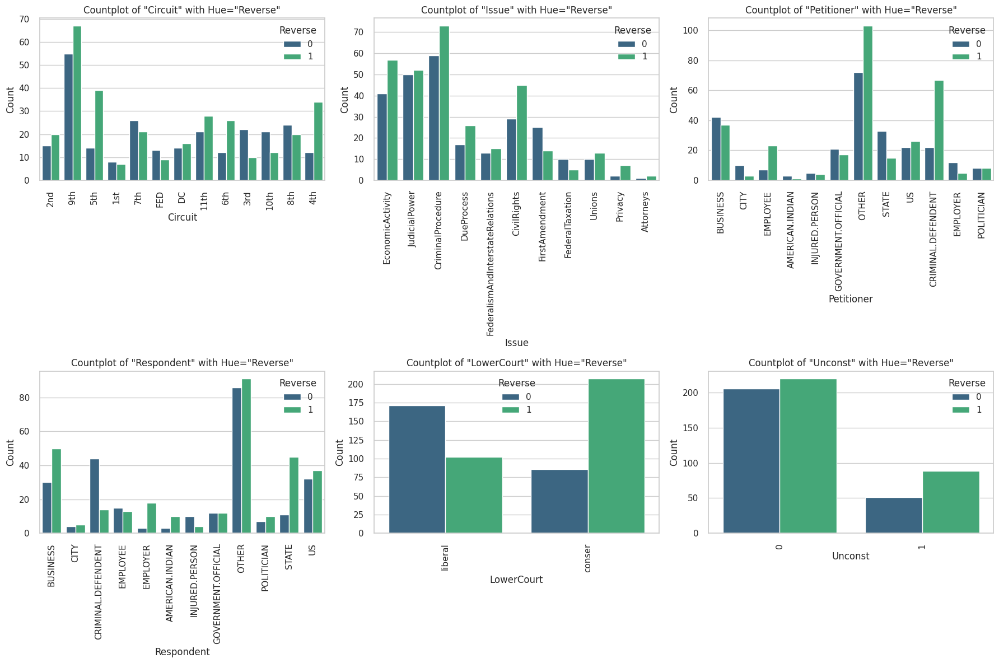

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df' with the required columns

# Set the style for the plot (optional)
sns.set(style="whitegrid")

# Create subplots for each column
columns_to_plot = ['Circuit','Issue', 'Petitioner', 'Respondent', 'LowerCourt', 'Unconst']
plt.figure(figsize=(18, 12))

for i, column in enumerate(columns_to_plot):
    plt.subplot(2, 3, i+1)
    sns.countplot(data=df, x=column, hue='Reverse', palette='viridis')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.title(f'Countplot of "{column}" with Hue="Reverse"')
    plt.xticks(rotation=90)
    plt.legend(title='Reverse')
# Add count values on top of the bars

# Adjust subplots layout
plt.tight_layout()

# Show the plot
plt.show()


***Insight:***
- A large portion of cases that were assumed to belong conservative court were reversed
- Majority of cases belong to 9th Circuit court
- Highest number of cases belong to Issue "Criminal_procedure"
- Higher propotion of cases reveresed when petetioner was criminal defendent.
- when petioner were politician equal number of cases of revered/not.
- when respondent was stste majority of cases were reversed.

### Most Common Issue

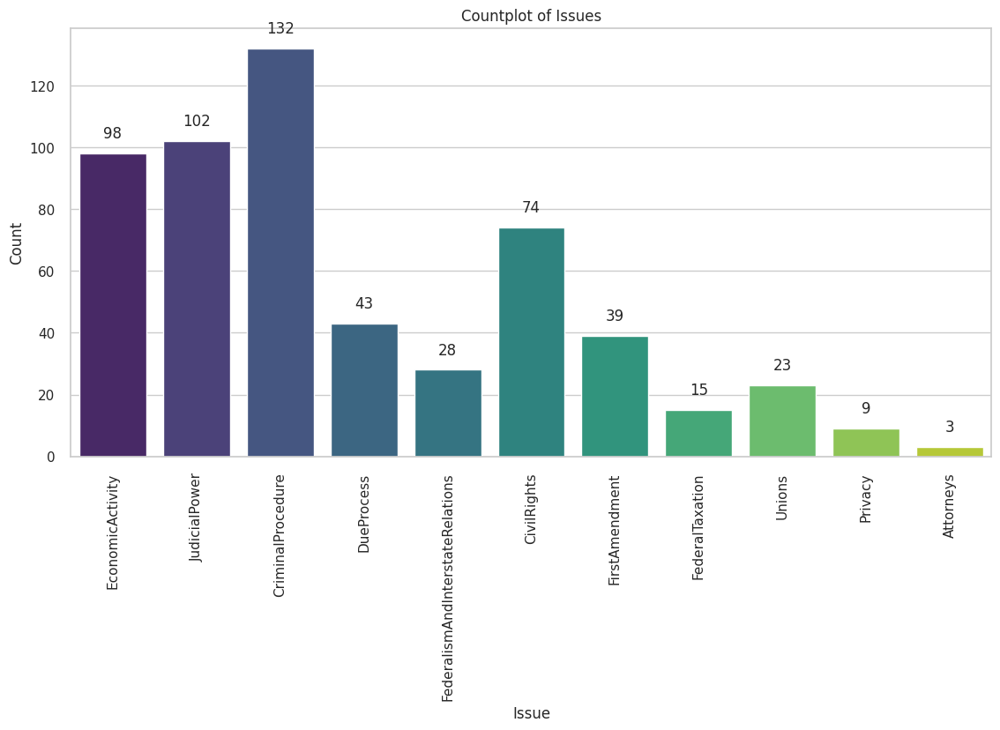

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# Assuming you have a DataFrame named 'df' with the 'Issue' column
# Set the style for the plot (optional)
sns.set(style="whitegrid")
# Create the countplot
plt.figure(figsize=(12, 6))
ax = sns.countplot(x='Issue', data=df, palette='viridis')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.xlabel('Issue')
plt.ylabel('Count')
plt.title('Countplot of Issues')

# Add count values on top of the bars
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 5, f'{int(height)}', ha="center")

plt.show()


*Insight:*
- As majority of cases are Criminal Procedures lets investigate Criminal Procedures.

### Per year Summary of cases

In [ ]:
df['Issue'].unique()

array(['EconomicActivity', 'JudicialPower', 'CriminalProcedure',
       'DueProcess', 'FederalismAndInterstateRelations', 'CivilRights',
       'FirstAmendment', 'FederalTaxation', 'Unions', 'Privacy',
       'Attorneys'], dtype=object)

In [ ]:
# Group the data by year (Term) and Issue, and calculate the count
issue_counts = df.groupby(['Term', 'Issue'])['Docket'].count().reset_index()

# Pivot the data to create a table with years as rows, issues as columns, and counts as values
pivot_table = issue_counts.pivot_table(index='Term', columns='Issue', values='Docket', fill_value=0)

# Display the resulting table
#print(pivot_table)
pivot_table.head(10)

Issue,Attorneys,CivilRights,CriminalProcedure,DueProcess,EconomicActivity,FederalTaxation,FederalismAndInterstateRelations,FirstAmendment,JudicialPower,Privacy,Unions
Term,,,,,,,,,,,
1994,1,10,19,1,18,3,8,5,14,0,1
1995,0,6,14,4,13,2,5,5,17,0,6
1996,0,11,15,8,18,2,3,6,13,3,2
1997,0,10,24,12,12,3,2,4,15,0,4
1998,0,17,16,4,12,1,1,2,18,1,4
1999,1,8,20,4,11,2,7,9,6,2,1
2000,1,6,19,6,12,2,2,7,15,1,2
2001,0,6,5,4,2,0,0,1,4,2,3


***Insight:***
- Most common Issue is Criminal Procedure lets Investigate it.

### Per year Count of Issue = Criminal procedure

In [ ]:
import pandas as pd
import plotly.express as px

# Assuming you have a DataFrame named 'df' with the 'Term' and 'Issue' columns

# Filter the DataFrame for rows where 'Issue' is 'CriminalProcedure'
criminal_procedure_df = df[df['Issue'] == 'CriminalProcedure']

# Group the filtered DataFrame by 'Term' (year) and count the occurrences
count_per_year = criminal_procedure_df.groupby('Term')['Issue'].count().reset_index()

# Create a bar plot using Plotly Express with text labels
fig = px.bar(count_per_year, x='Term', y='Issue', labels={'Term': 'Year', 'Issue': 'Count'},
             title='Count of "CriminalProcedure" Issue per Year',
             text='Issue')  # Add count values as text labels

# Customize the layout (optional)
fig.update_traces(marker_color='skyblue')
fig.update_xaxes(tickangle=45)

# Show the plot
fig.show()


***Insight:***
- in 1997  the count is highest
- can investigate what happened in 1997? maybe polictical/social reaseon

### Lets Check How many cases were Revered

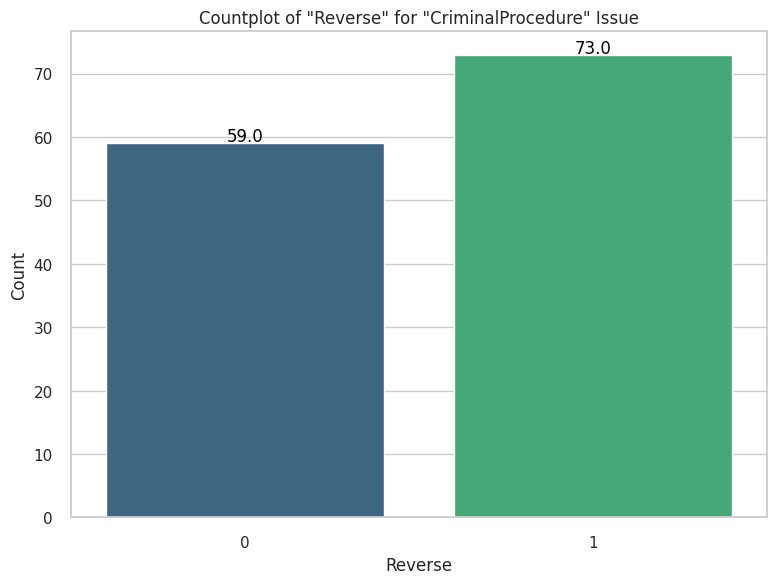

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'criminal_procedure_df' with the 'Reverse' column

# Set the style for the plot (optional)
sns.set(style="whitegrid")

# Create the countplot
plt.figure(figsize=(8, 6))
ax = sns.countplot(data=criminal_procedure_df, x='Reverse', palette='viridis')
plt.xlabel('Reverse')
plt.ylabel('Count')
plt.title('Countplot of "Reverse" for "CriminalProcedure" Issue')
plt.xticks(rotation=0)  # No rotation of x-axis labels

# Add count values to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

# Show the plot
plt.show()


***Insight:***
- Lets Investigate which cases were reversed


### Per Year count of Reveresed and not Reversed cases

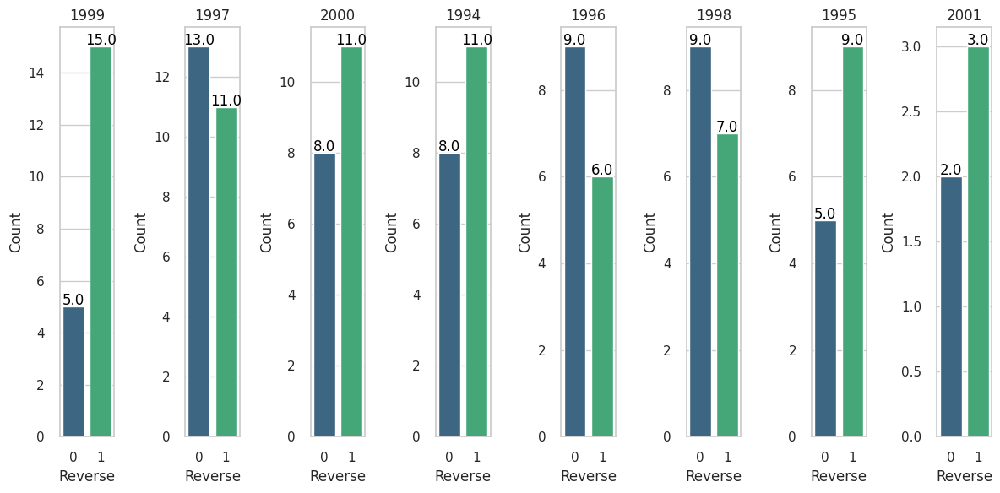

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'criminal_procedure_df' with 'Term' and 'Reverse' columns

# Set the style for the plot (optional)
sns.set(style="whitegrid")

# Create subplots for each year
plt.figure(figsize=(12, 6))
for i, year in enumerate(criminal_procedure_df['Term'].unique()):
    plt.subplot(1, len(criminal_procedure_df['Term'].unique()), i+1)
    ax=sns.countplot(data=criminal_procedure_df[criminal_procedure_df['Term'] == year], x='Reverse', palette='viridis')
    plt.xlabel('Reverse')
    plt.ylabel('Count')
    plt.title(year)
    plt.xticks(rotation=0)
# Add count values to the bars
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                    textcoords='offset points')

# Show the plot
# Adjust subplots layout
plt.tight_layout()
# Show the plot
plt.show()


***Insight:***
- As majority of cases are reversed so, we will check which kind of lower court they are associated with.

### Lets Check The court Associated with Reveresed Cases

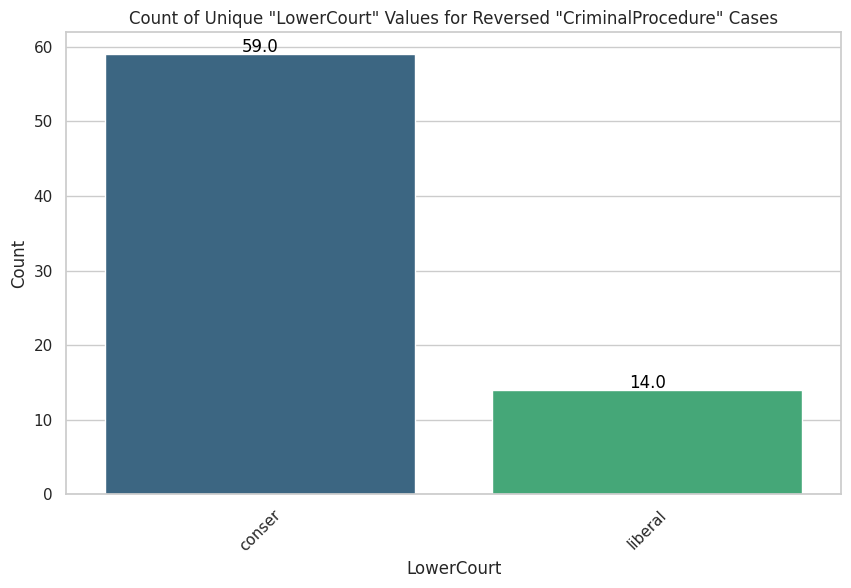

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df' with the required columns

# 1. Filter for "CriminalProcedure" issues with "Reverse=1" for per-year counts
criminal_procedure_reverse_df = df[(df['Issue'] == 'CriminalProcedure') & (df['Reverse'] == 1)]

# 2. Plot the count of unique values of "LowerCourt" for all the reversed cases
plt.figure(figsize=(10, 6))
ax=sns.countplot(data=criminal_procedure_reverse_df, x='LowerCourt', palette='viridis')
plt.xlabel('LowerCourt')
plt.ylabel('Count')
plt.title('Count of Unique "LowerCourt" Values for Reversed "CriminalProcedure" Cases')
plt.xticks(rotation=45)
# Add count values to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

# Show the plot

# Show the plot
plt.show()




***Insight:***
- Majority of cases reversed belonged to conservative court.*italicised text*

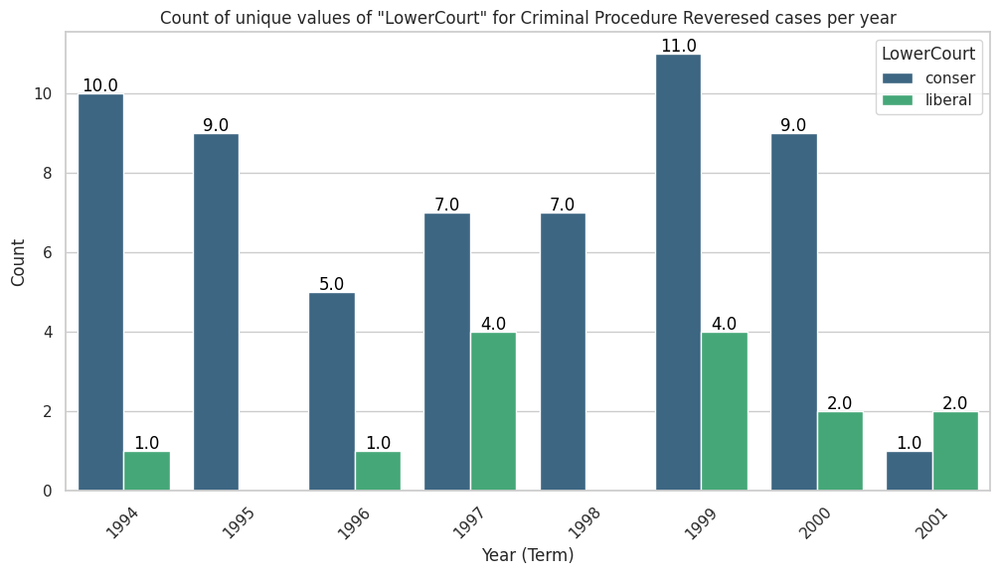

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'criminal_procedure_reverse_df' with the required columns

# Group the DataFrame by 'Term' and 'LowerCourt' and count the occurrences
criminal_procedure_reverse_df = df[(df['Issue'] == 'CriminalProcedure') & (df['Reverse'] == 1)]
count_data = criminal_procedure_reverse_df.groupby(["Term", "LowerCourt"])['Docket'].count().reset_index()

# Create a bar plot
plt.figure(figsize=(12, 6))
ax=sns.barplot(data=count_data, x='Term', y='Docket', hue='LowerCourt', palette='viridis')
plt.xlabel('Year (Term)')
plt.ylabel('Count')
plt.title('Count of unique values of "LowerCourt" for Criminal Procedure Reveresed cases per year')
plt.xticks(rotation=45)
plt.legend(title='LowerCourt')
# Add count values to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

# Show the plot
# Show the plot
plt.show()


***Insight:***

---



---


- Majority of cases revesed belonged to lower court that was persumed to be conservative
- it remains trend over years

### Petitioner in Reversed Cases

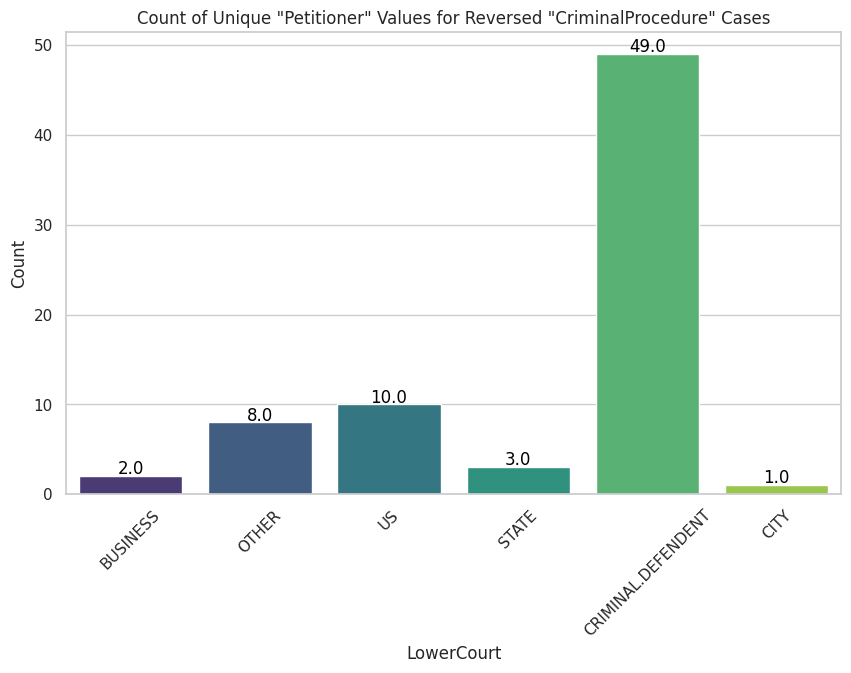

In [ ]:
#criminal_procedure_reverse_df.head()

plt.figure(figsize=(10, 6))
ax=sns.countplot(data=criminal_procedure_reverse_df, x='Petitioner', palette='viridis')
plt.xlabel('Petitioner')
plt.ylabel('Count')
plt.title('Count of Unique "Petitioner" Values for Reversed "CriminalProcedure" Cases')
plt.xticks(rotation=45)
# Add count values to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

# Show the plot
plt.show()

### Respondenet in Reversed Cases

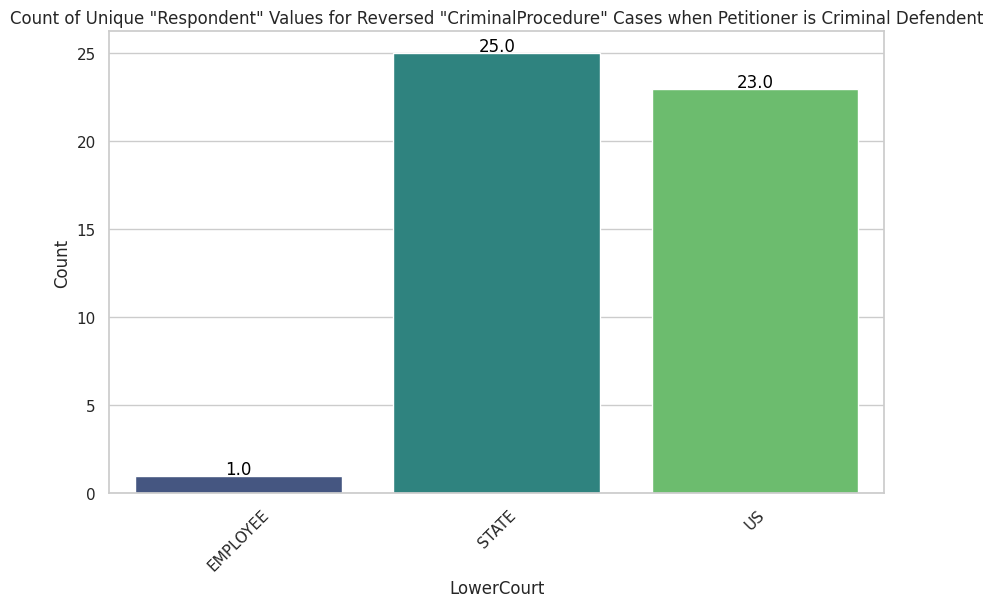

In [ ]:
criminal_def_df = df[(df['Issue'] == 'CriminalProcedure') & (df['Reverse'] == 1) & (df['Petitioner']=='CRIMINAL.DEFENDENT')]
plt.figure(figsize=(10, 6))
ax=sns.countplot(data=criminal_def_df, x='Respondent', palette='viridis')
plt.xlabel('Respondent')
plt.ylabel('Count')
plt.title('Count of Unique "Respondent" Values for Reversed "CriminalProcedure" Cases when Petitioner is Criminal Defendent')
plt.xticks(rotation=45)
# Add count values to the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

# Show the plot
# Show the plot
plt.show()

Insights:
- In Majority of reversed cases Petitioner was Criminal Defendent
- In the Majority of reversed cases Respondent was either Sate or US

####  Insights:
- Majority of Cases were Reversed
- Majority of Issue in Reversed cases is Criminal Procdures
- For Maority of Reversed cases Petioner is Criminal Defendent
- For Maority of Reversed cases Respondent is either Sate or US
- Majority of Reversed cases belong to Conservative Lower court

### Is Justice Stevens Conservative?

In [ ]:
import plotly.graph_objects as go
import numpy as np

count_0, count_1=0,0
Year_wise_reverse_count={}
for year in df['Term'].unique():
    test=df[df['Term']==year]
    count_0=len(test[test['Reverse']==0])
    count_1=len(test[test['Reverse']==1])
    Year_wise_reverse_count[year]=[count_0,count_1]
# Given dictionary
data = {
    1994: [37, 43],
    1995: [33, 39],
    1996: [38, 43],
    1997: [38, 48],
    1998: [34, 42],
    1999: [32, 39],
    2000: [35, 38],
    2001: [10, 17]
}

# Extract keys (years) and values (two sets of values)
years = list(Year_wise_reverse_count.keys())
values1 = [entry[0] for entry in Year_wise_reverse_count.values()]
values2 = [entry[1] for entry in Year_wise_reverse_count.values()]

# Calculate the difference between values1 and values2
differences = [val2 - val1 for val1, val2 in zip(values1, values2)]

# Create a Plotly bar chart
fig = go.Figure()

fig.add_trace(go.Bar(
    x=years,
    y=values1,
    name='Number of Cases not Reversed',
    marker_color='blue',
    text=values1,  # Display counts as text on the bars
    textposition='outside'  # Place the text outside the bars
))

fig.add_trace(go.Bar(
    x=years,
    y=values2,
    name='Number of Cases Reversed',
    marker_color='orange',
    text=values2,  # Display counts as text on the bars
    textposition='outside'  # Place the text outside the bars
))

fig.add_trace(go.Bar(
    x=years,
    y=differences,
    name='Difference',
    marker_color='green',
    text=differences,  # Display differences as text on the bars
    textposition='outside'  # Place the text outside the bars
))

fig.update_layout(
    title='Bar Graph with Two Values per Year and Their Differences',
    xaxis=dict(title='Year'),
    yaxis=dict(title='Values'),
    barmode='group'  # 'group' places the bars centered around the key
)

# Show the Plotly figure
fig.show()


In [ ]:
# Assuming you have a DataFrame named df containing your dataset

# Create a new DataFrame for liberal LowerCourt
liberal_df = df[df['LowerCourt'] == 'liberal'].copy()

# Create a new DataFrame for conservative LowerCourt
conservative_df = df[df['LowerCourt'] == 'conser'].copy()

import plotly.express as px

# Assuming you have the conservative_df and liberal_df DataFrames

# Count unique values of Reverse in conservative_df and liberal_df
conservative_reverse_counts = conservative_df['Reverse'].value_counts().reset_index()
conservative_reverse_counts.columns = ['Reverse', 'Conservative Count']

liberal_reverse_counts = liberal_df['Reverse'].value_counts().reset_index()
liberal_reverse_counts.columns = ['Reverse', 'Liberal Count']

# Merge the counts dataframes and fill missing values with zeros
merged_counts = conservative_reverse_counts.merge(liberal_reverse_counts, on='Reverse', how='outer').fillna(0)

# Create a new DataFrame with data for the grouped bar chart
grouped_counts = pd.melt(merged_counts, id_vars=['Reverse'], var_name='Dataset', value_name='Count')

# Create a grouped bar chart using Plotly
fig = px.bar(grouped_counts, x='Reverse', y='Count', color='Dataset', text='Count',
             labels={'Reverse': 'Unique Value of Reverse', 'Count': 'Count', 'Dataset': 'Dataset'},
             title='Count of Unique Values of Reverse in Conservative and Liberal Datasets',
             barmode='group',  # To create grouped bars
             color_discrete_map={'Conservative Count': 'blue', 'Liberal Count': 'red'})

# Customize text placement
fig.update_traces(textposition='outside')

# Show the Plotly figure
fig.show()




In [ ]:
# percentage of decison reversed
import plotly.express as px
import pandas as pd

# Assuming you have the conservative_df and liberal_df DataFrames

# Calculate the percentage of cases where "Reverse" is 1 for conservative_df
conservative_reversed_1 = (conservative_df['Reverse'] == 1).sum()
conservative_total_cases = len(conservative_df)
conservative_percentage = (conservative_reversed_1 / conservative_total_cases) * 100

# Calculate the percentage of cases where "Reverse" is 1 for liberal_df
liberal_reversed_1 = (liberal_df['Reverse'] == 1).sum()
liberal_total_cases = len(liberal_df)
liberal_percentage = (liberal_reversed_1 / liberal_total_cases) * 100

# Create a DataFrame for pie chart data
data = {
    'Dataset': ['Conservative', 'Liberal'],
    'Percentage Reversed 1': [conservative_percentage, liberal_percentage]
}

pie_df = pd.DataFrame(data)

# Create a bar chart using Plotly
fig = px.bar(pie_df, x='Percentage Reversed 1', y= 'Dataset',
             labels={'Percentage Reversed 1': 'Percentage'},
             title='Percentage of Cases with "Reverse" = 1 in Conservative and Liberal Datasets')
# Add percentage value annotations to the bars
for index, row in pie_df.iterrows():
    fig.add_annotation(
        y=row['Dataset'],
        x=row['Percentage Reversed 1'],
        text=f'{row["Percentage Reversed 1"]:.2f}%',
        showarrow=False,
        font=dict(size=12)
    )

# Show the Plotly figure
fig.show()

In [ ]:
#import pandas as pd
import plotly.express as px

# Assuming you have the DataFrame named df with the provided columns

# Filter the DataFrame for LowerCourt = liberal and Reverse = 1
liberal_reverse_df = df[(df['LowerCourt'] == 'liberal') & (df['Reverse'] == 1)]

# Filter the DataFrame for LowerCourt = conser and Reverse = 1
conser_reverse_df = df[(df['LowerCourt'] == 'conser') & (df['Reverse'] == 1)]

# Calculate the total number of cases for each term
term_total_cases = df.groupby('Term')['Docket'].count().reset_index()

# Calculate the total number of cases reversed for liberal and conser for each term
term_liberal_cases = liberal_reverse_df.groupby('Term')['Docket'].count().reset_index()
term_conser_cases = conser_reverse_df.groupby('Term')['Docket'].count().reset_index()

# Merge the DataFrames to get term-wise counts for both liberal and conser
term_percentage_df = pd.merge(term_total_cases, term_liberal_cases, on='Term', suffixes=('_total', '_liberal'))
term_percentage_df = pd.merge(term_percentage_df, term_conser_cases, on='Term', suffixes=('_liberal', '_conser'))

# Calculate the percentage of cases reversed for each term
term_percentage_df['Percentage Reversed Liberal'] = (term_percentage_df['Docket_liberal'] / term_percentage_df['Docket_total']) * 100
term_percentage_df['Percentage Reversed Conser'] = (term_percentage_df['Docket'] / term_percentage_df['Docket_total']) * 100

# Create a grouped bar chart using Plotly with barmode='group'
fig = px.bar(term_percentage_df, x='Term', y=['Percentage Reversed Liberal', 'Percentage Reversed Conser'],
             labels={'Term': 'Term', 'value': 'Percentage Reversed'},
             title='Term-Wise Percentage of Cases Reversed for Liberal and Conservative LowerCourt',
             color_discrete_map={'Percentage Reversed Liberal': 'red', 'Percentage Reversed Conser': 'blue'},
             barmode='group')  # This will group the bars by 'Term'


# Show the Plotly figure
fig.show()



In [ ]:

# Create a time series-like curve using Plotly Express
fig = px.line(term_percentage_df, x='Term', y=['Percentage Reversed Liberal', 'Percentage Reversed Conser'],
              labels={'Term': 'Term', 'value': 'Percentage Reversed'},
              title='Term-Wise Percentage of Cases Reversed for Liberal and Conservative LowerCourt',
              color_discrete_map={'Percentage Reversed Liberal': 'blue', 'Percentage Reversed Conser': 'red'})

# Show the Plotly figure
fig.show()


**Insights:**
- Justice Stevens is self proclaimed Conservative

## Feature Selection

In [ ]:
df.head()

,Docket,Term,Circuit,Issue,Petitioner,Respondent,LowerCourt,Unconst,Reverse
0,93-1408,1994,2nd,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
1,93-1577,1994,9th,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
2,93-1612,1994,5th,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
3,94-623,1994,1st,EconomicActivity,BUSINESS,BUSINESS,conser,0,1
4,94-1175,1995,7th,JudicialPower,BUSINESS,BUSINESS,conser,0,1


In [ ]:
df=df.drop(columns=['Docket', 'Term'])

In [ ]:
df.head()

,Circuit,Issue,Petitioner,Respondent,LowerCourt,Unconst,Reverse
0,2nd,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
1,9th,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
2,5th,EconomicActivity,BUSINESS,BUSINESS,liberal,0,1
3,1st,EconomicActivity,BUSINESS,BUSINESS,conser,0,1
4,7th,JudicialPower,BUSINESS,BUSINESS,conser,0,1


## Data Modelling

### Label Encoding

In [ ]:
# Initialize the LabelEncoder
label_encoder = LabelEncoder()
# Fit and transform the categorical column
df['Issue'] = label_encoder.fit_transform(df['Issue'])
df['Petitioner'] = label_encoder.fit_transform(df['Petitioner'])
df['Respondent'] = label_encoder.fit_transform(df['Respondent'])
df['LowerCourt'] = label_encoder.fit_transform(df['LowerCourt'])
df['Circuit'] = label_encoder.fit_transform(df['Circuit'])

In [ ]:
df["Circuit"].unique()

array([ 3, 10,  6,  2,  8, 12, 11,  1,  7,  4,  0,  9,  5])

In [ ]:
df.head()

,Circuit,Issue,Petitioner,Respondent,LowerCourt,Unconst,Reverse
0,3,4,1,1,1,0,1
1,10,4,1,1,1,0,1
2,6,4,1,1,1,0,1
3,2,4,1,1,0,0,1
4,8,8,1,1,0,0,1


## Data Modelling

### Decision Tree

Best Hyperparameters: {'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': 30, 'min_samples_leaf': 2, 'min_samples_split': 5, 'splitter': 'best'}
Test accuracy: 0.631578947368421


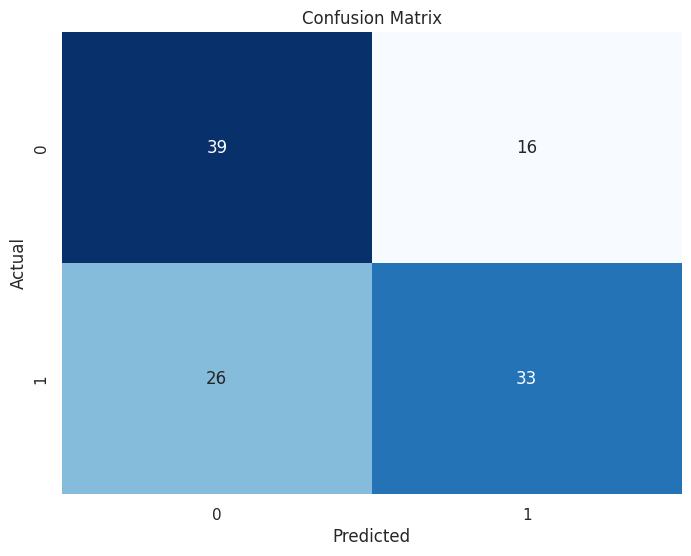

Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.71      0.65        55
           1       0.67      0.56      0.61        59

    accuracy                           0.63       114
   macro avg       0.64      0.63      0.63       114
weighted avg       0.64      0.63      0.63       114



In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
X = df.drop('Reverse', axis=1)
y = df['Reverse']  # Use a 1D array for the target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
dt_classifier = DecisionTreeClassifier()
param_grid = {
    'criterion': ['gini', 'entropy'],          # Splitting criterion
    'splitter': ['best', 'random'],            # Node splitting strategy
    'max_depth': [None, 5, 10, 15, 20],       # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],          # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],            # Minimum samples required to be a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider for the best split
    'max_leaf_nodes': [None, 10, 20, 30]      # Maximum number of leaf nodes
}


grid_search = GridSearchCV(dt_classifier, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
# Get Best parameters
best_params = grid_search.best_params_
best_dt_classifier = DecisionTreeClassifier(**best_params)
best_dt_classifier.fit(X_train, y_train)
accuracy = best_dt_classifier.score(X_test, y_test)
print("Best Hyperparameters:", best_params)
print(f"Test accuracy: {accuracy}")
# Evaluate the model on the test set
y_test_pred = best_dt_classifier.predict(X_test)
# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)
# Calculate the classification report
class_report = classification_report(y_test, y_test_pred)
# Plot the confusion matrix using Seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
# Print the classification report
print("Classification Report:\n", class_report)

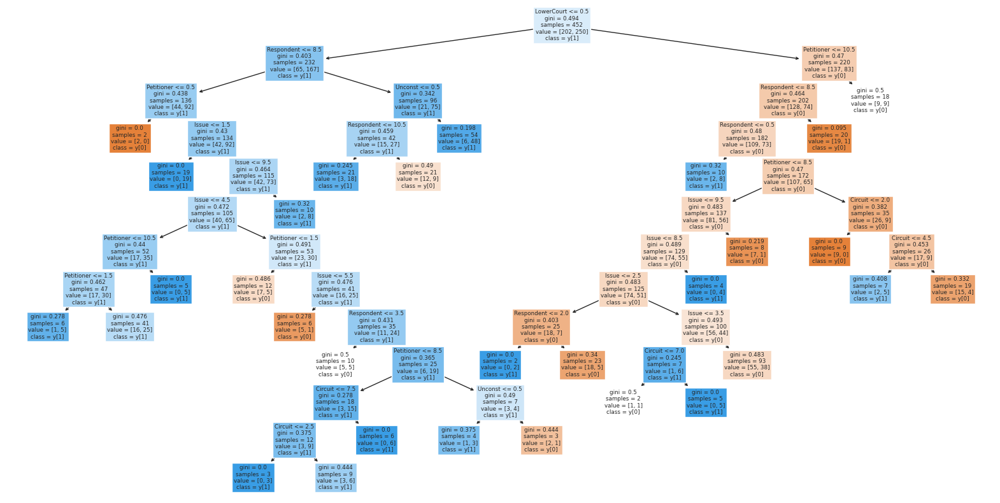

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt
# Plot the Decision Tree
plt.figure(figsize=(20, 10))
plot_tree(best_dt_classifier, filled=True, feature_names=X.columns, class_names=True)
plt.show()

Feature ranking:
1. Feature 'LowerCourt' (0.3541)
2. Feature 'Respondent' (0.2154)
3. Feature 'Issue' (0.2143)
4. Feature 'Petitioner' (0.0911)
5. Feature 'Circuit' (0.0790)
6. Feature 'Unconst' (0.0462)


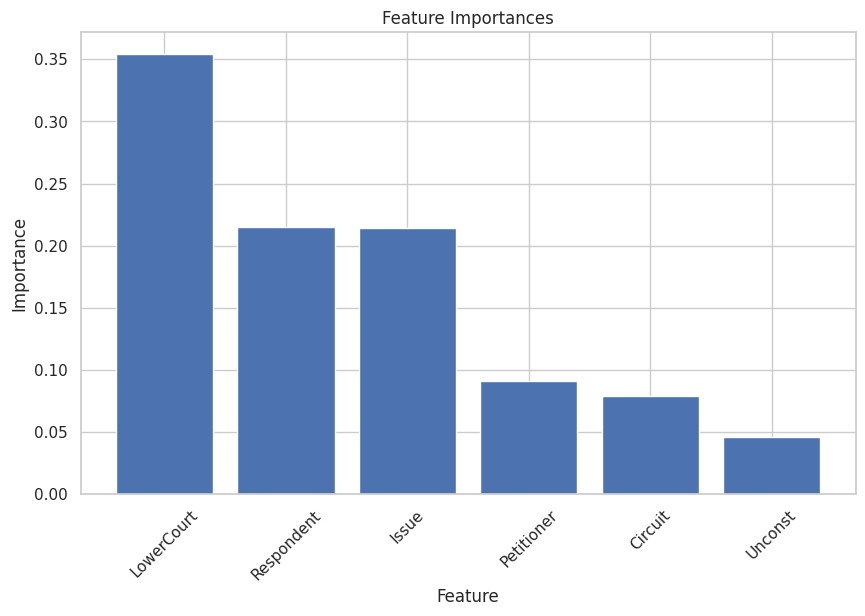

In [ ]:
# Get feature importances from the trained model
importances = best_dt_classifier.feature_importances_

# Get the names of the features
feature_names = X.columns  # Replace with your actual feature names

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")
for f in range(len(indices)):
    print(f"{f + 1}. Feature '{feature_names[indices[f]]}' ({importances[indices[f]]:.4f})")

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(range(len(indices)), importances[indices], align="center")
plt.xticks(range(len(indices)), [feature_names[i] for i in indices], rotation=45)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.show()



No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


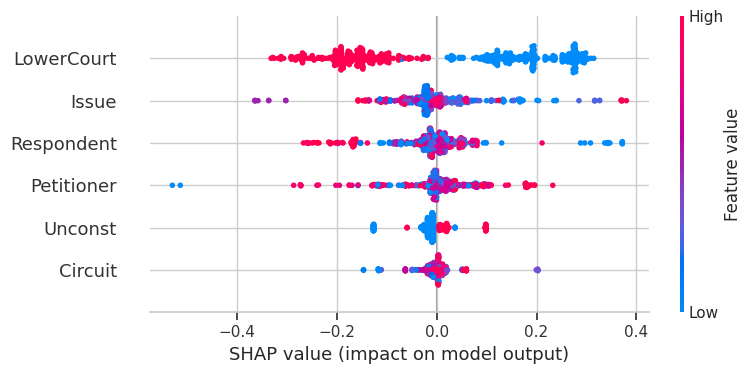

In [ ]:
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.Explainer(best_dt_classifier)
# calculate shap values. This is what we will plot.
# Calculate shap_values for all of val_X rather than a single row, to have more data for plot.
shap_values = explainer.shap_values(X)

# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[1], X)


### DT Viz

In [ ]:
from sklearn.tree import export_graphviz
import graphviz

# Export the decision tree to a .dot file
export_graphviz(best_dt_classifier, out_file='dt.dot',
                feature_names=X.columns,
                class_names=["0","1"],
                filled=True, rounded=True,
                special_characters=True)

# Visualize the decision tree using graphviz
with open('/content/dt.dot') as f:
    dot_graph = f.read()
graph = graphviz.Source(dot_graph)
graph.render('stevens_tree', view=True)

'stevens_tree.pdf'

### Random Forest

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Hyperparameters: {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
Test Accuracy: 0.6491228070175439


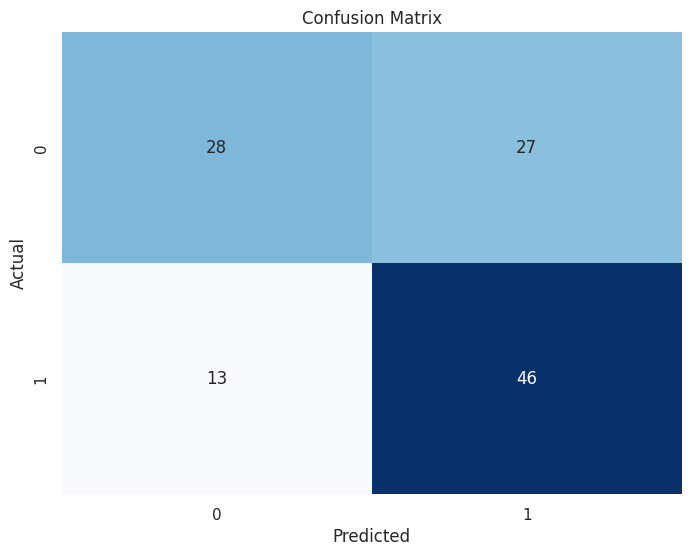

Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.51      0.58        55
           1       0.63      0.78      0.70        59

    accuracy                           0.65       114
   macro avg       0.66      0.64      0.64       114
weighted avg       0.66      0.65      0.64       114



In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Load your dataset or replace this with your data loading code
# X should contain your feature columns, and y should contain the target variable
# For example:
X = df.drop('Reverse', axis=1)
y = df['Reverse']  # Use a 1D array for the target



# Split the data into training, validation, and test sets
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=42)
#X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


# lets standardise the xtrain and xtest
standard=StandardScaler()
X_train=standard.fit_transform(X_train)
X_test=standard.transform(X_test)


# Define the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Define a parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Create a GridSearchCV object with validation set for hyperparameter tuning
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Create a Random Forest classifier with the best hyperparameters
best_rf_classifier = RandomForestClassifier(random_state=42, **best_params)

# Train the final model on the training data
best_rf_classifier.fit(X_train, y_train)

# Evaluate the model on the validation set
#y_val_pred = best_rf_classifier.predict(X_val)
#validation_accuracy = accuracy_score(y_val, y_val_pred)
#print("Validation Accuracy:", validation_accuracy)

# Evaluate the model on the test set
y_test_pred = best_rf_classifier.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)
print("Test Accuracy:", test_accuracy)

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Calculate the classification report
class_report = classification_report(y_test, y_test_pred)

# Plot the confusion matrix using Seaborn heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Print the classification report
print("Classification Report:\n", class_report)


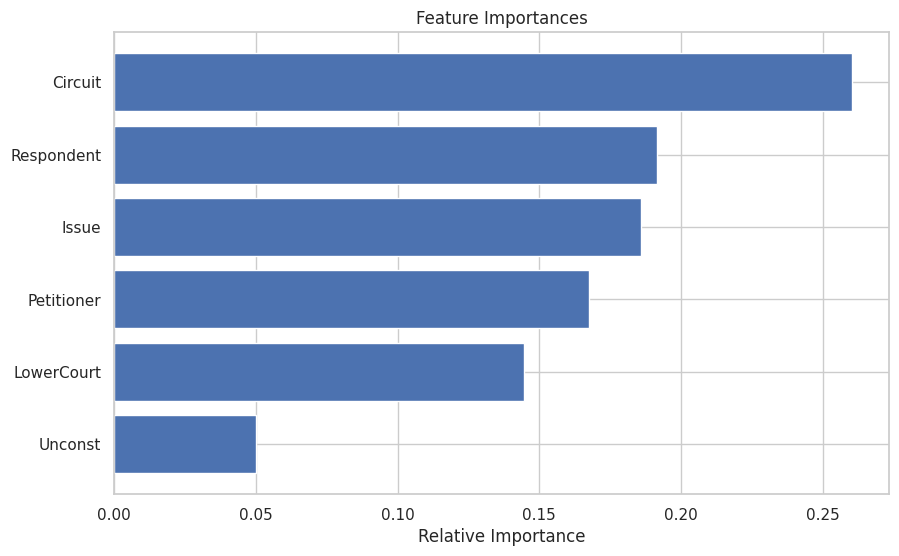

Decision Tree 1:
|--- Respondent <= 0.89
|   |--- LowerCourt <= 0.03
|   |   |--- Circuit <= -1.71
|   |   |   |--- Petitioner <= -1.10
|   |   |   |   |--- class: 0.0
|   |   |   |--- Petitioner >  -1.10
|   |   |   |   |--- class: 1.0
|   |   |--- Circuit >  -1.71
|   |   |   |--- Circuit <= 0.27
|   |   |   |   |--- Circuit <= -1.42
|   |   |   |   |   |--- class: 1.0
|   |   |   |   |--- Circuit >  -1.42
|   |   |   |   |   |--- Respondent <= -1.17
|   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |--- Respondent >  -1.17
|   |   |   |   |   |   |--- Issue <= -0.67
|   |   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |   |--- Issue >  -0.67
|   |   |   |   |   |   |   |--- Petitioner <= -1.25
|   |   |   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |   |   |--- Petitioner >  -1.25
|   |   |   |   |   |   |   |   |--- Issue <= -0.31
|   |   |   |   |   |   |   |   |   |--- class: 0.0
|   |   |   |   |   |   |   |   |--- Issue >  -0.31
|   |   |   |   

In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import export_text

importances = best_rf_classifier.feature_importances_
feature_names = list(X.columns)
indices = np.argsort(importances)

plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

# Visualize individual decision trees (first 3 trees in the forest)
for i in range(3):
    tree = best_rf_classifier.estimators_[i]
    tree_rules = export_text(tree, feature_names=feature_names)
    print(f"Decision Tree {i + 1}:\n{tree_rules}\n")






### Features Impact


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


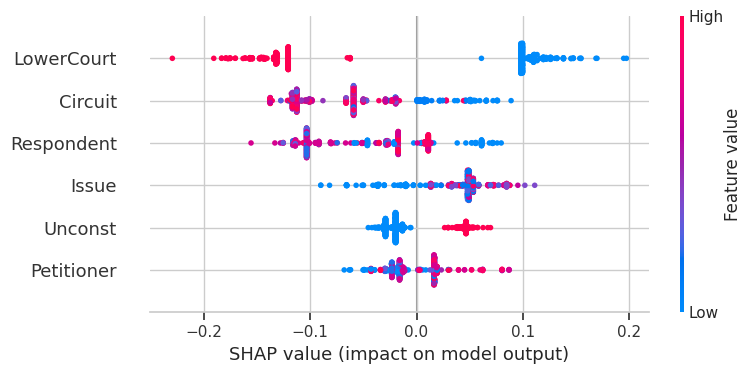

In [ ]:
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.Explainer(best_rf_classifier)
# calculate shap values. This is what we will plot.
# Calculate shap_values for all of val_X rather than a single row, to have more data for plot.
shap_values = explainer.shap_values(X)

# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[1], X)


### ROC Curve Comparison

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



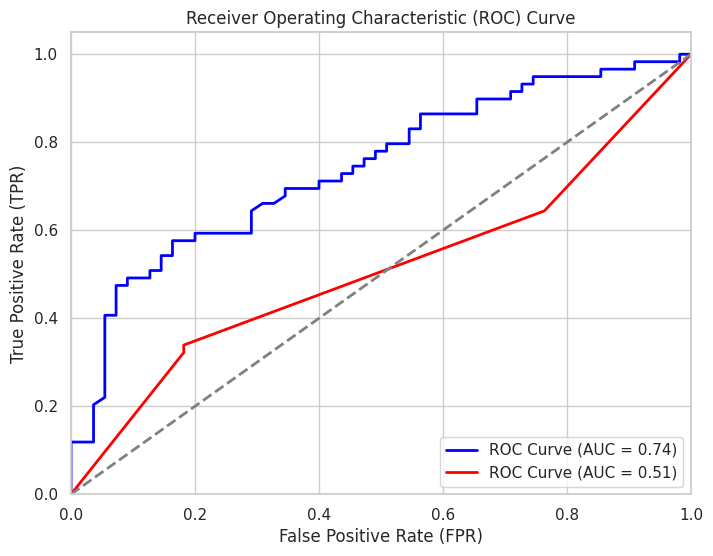

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Assuming you have a binary classification model 'model' and test data 'X_test' and 'y_test'

# Get predicted probabilities for the positive class (class 1)
y_prob_dt= best_dt_classifier.predict_proba(X_test)[:, 1]

# Calculate the ROC curve
fpr_dt, tpr_dt, thresholds_dt = roc_curve(y_test, y_prob_dt)

# Calculate the AUC (Area Under the Curve) score
auc_score_dt = roc_auc_score(y_test, y_prob_dt)


# Get predicted probabilities for the positive class (class 1)
y_prob_rf = best_rf_classifier.predict_proba(X_test)[:, 1]

# Calculate the ROC curve
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_prob_rf)

# Calculate the AUC (Area Under the Curve) score
auc_score_rf = roc_auc_score(y_test, y_prob_rf)




# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_rf, tpr_rf, color='blue', lw=2, label=f'ROC Curve (AUC = {auc_score_rf:.2f})')
plt.plot(fpr_dt, tpr_dt, color='red', lw=2, label=f'ROC Curve (AUC = {auc_score_dt:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
